In [3]:
from PS_S2_fusion import *

In [4]:
# 1. Load NDVI data
data_loader = NDVIDataLoader()
sentinel_images_2022 = data_loader.load_ndvi_images("S2_2022", "*.tif")
planet_images_2022 = data_loader.load_ndvi_images("PS_2022", "*.tif")
sentinel_images_2021 = data_loader.load_ndvi_images("S2_2021", "*.tif")
planet_images_2021 = data_loader.load_ndvi_images("PS_2021", "*.tif")

# 2. Prepare data for regression
processor = NDVIProcessor()
sentinel_ndvi, planet_ndvi, resampled_sentinel_images_2022 = (
    processor.prepare_data_for_regression(sentinel_images_2022, planet_images_2022)
)

_, _, resampled_sentinel_images_2021 = (
    processor.prepare_data_for_regression(sentinel_images_2021, planet_images_2021)
)

Loading model from: ndvi_model_linear_regression_scaled_True.pkl
Mean Squared Error: 0.005616434384137392
Model saved to: ndvi_model_linear_regression_scaled_True.pkl


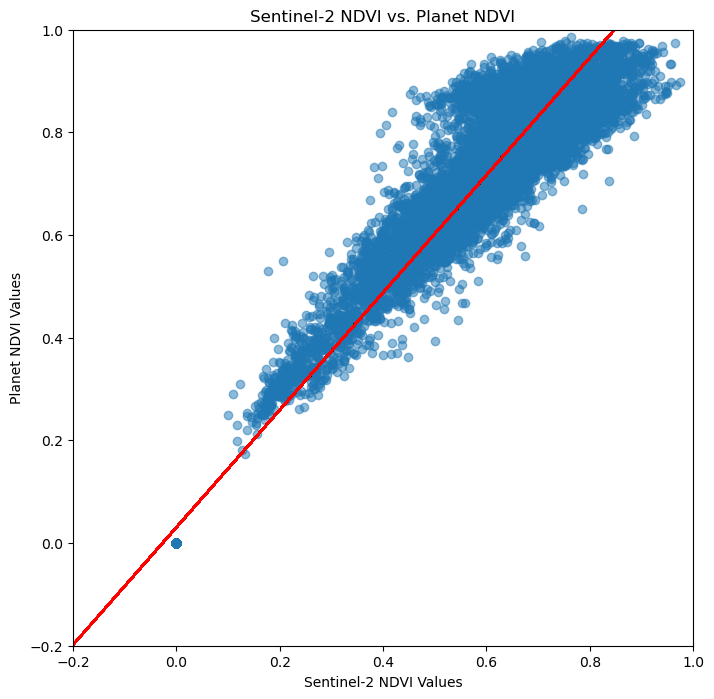

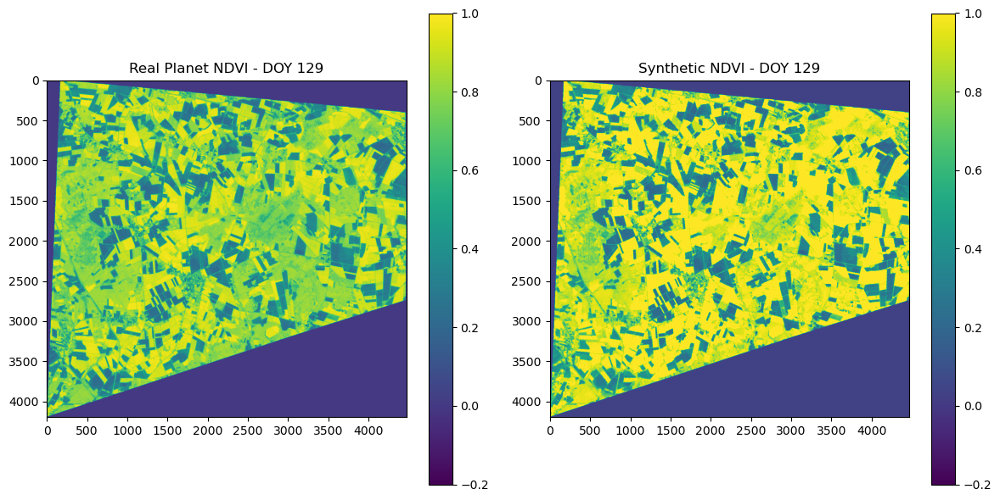

In [5]:

# 3. Train and evaluate the regression model

# rf_model = RandomForestRegressor(n_estimators=200, max_depth=30, random_state=42)
linear_model = LinearRegression()
regressor = NDVIRegressor(model=linear_model)
X_train, X_test, y_train, y_test = train_test_split(
    sentinel_ndvi, planet_ndvi, test_size=0.2, random_state=42
)
regressor.train(X_train, y_train)
mse = regressor.evaluate(X_test, y_test)
print(f"Mean Squared Error: {mse}")

regressor.save_model()

# 4. Generate synthetic NDVI images
synthesizer = NDVISynthesizer(regressor)
day_of_year_to_plot = 129  # Example day of year
synthetic_planet_ndvi = synthesizer.generate_synthetic_ndvi(
    resampled_sentinel_images_2021[day_of_year_to_plot]
)

# 5. Visualize results
visualizer = NDVIVisualizer()
visualizer.visualize_scatter_plot(X_test, y_test, regressor)
visualizer.visualize_ndvi_images(
    planet_images_2021[day_of_year_to_plot],
    synthetic_planet_ndvi,
    day_of_year_to_plot,
)

Training model from scratch...
Mean Squared Error: 0.003710620538504636
Model saved to: ndvi_modelmax_depth=30_max_features=sqrt_n_estimators=4_scaled_True.pkl


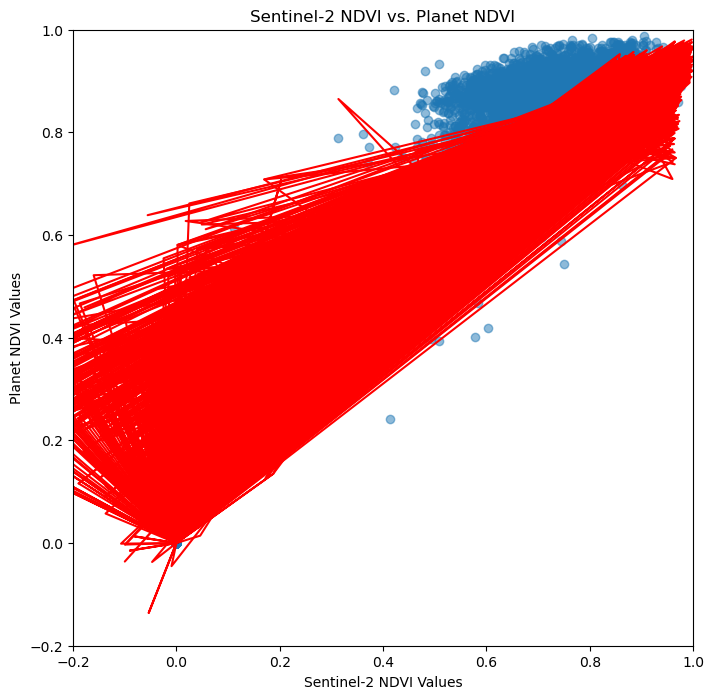

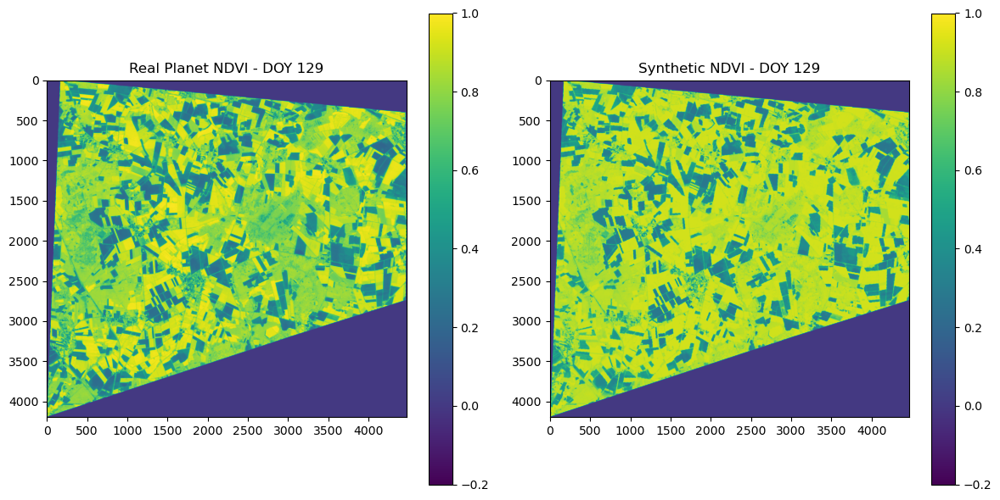

In [7]:
rf_model = RandomForestRegressor(n_estimators=4, max_depth=30, random_state=42, max_features='sqrt', n_jobs=10)

regressor = NDVIRegressor(model=rf_model)
X_train, X_test, y_train, y_test = train_test_split(
    sentinel_ndvi, planet_ndvi, test_size=0.2, random_state=42
)
regressor.train(X_train, y_train.ravel())
mse = regressor.evaluate(X_test, y_test.ravel())
print(f"Mean Squared Error: {mse}")

regressor.save_model()

# 4. Generate synthetic NDVI images
synthesizer = NDVISynthesizer(regressor)
day_of_year_to_plot = 129  # Example day of year
synthetic_planet_ndvi = synthesizer.generate_synthetic_ndvi(
    resampled_sentinel_images_2021[day_of_year_to_plot]
)

# 5. Visualize results
visualizer = NDVIVisualizer()
visualizer.visualize_scatter_plot(X_test, y_test, regressor)
visualizer.visualize_ndvi_images(
    planet_images_2021[day_of_year_to_plot],
    synthetic_planet_ndvi,
    day_of_year_to_plot,
)

In [9]:
rf_model = RandomForestRegressor(n_estimators=1000, max_depth=5, random_state=42, max_features='sqrt', n_jobs=10)

regressor = NDVIRegressor(model=rf_model)
X_train, X_test, y_train, y_test = train_test_split(
    sentinel_ndvi, planet_ndvi, test_size=0.2, random_state=42
)
regressor.train(X_train, y_train)
mse = regressor.evaluate(X_test, y_test)
print(f"Mean Squared Error: {mse}")

regressor.save_model()

# 4. Generate synthetic NDVI images
synthesizer = NDVISynthesizer(regressor)
day_of_year_to_plot = 129  # Example day of year
synthetic_planet_ndvi = synthesizer.generate_synthetic_ndvi(
    resampled_sentinel_images_2021[day_of_year_to_plot]
)

# # 5. Visualize results
# visualizer = NDVIVisualizer()
# visualizer.visualize_scatter_plot(X_test, y_test, regressor)
# visualizer.visualize_ndvi_images(
#     planet_images_2021[day_of_year_to_plot],
#     synthetic_planet_ndvi,
#     day_of_year_to_plot,
# )

Training model from scratch...


/home/v/.conda/envs/data_fusion/lib/python3.12/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


In [28]:
sentinel_images = load_ndvi_images(sentinel_directory, "*_doy_*.tif")
planet_images = load_ndvi_images(planet_directory, "*_doy_*.tif")

# Set scale_data to True to enable scaling, False to disable
scale_data = True

# Regression with each image as feature

In [12]:
X, y, resampled_sentinel_images = prepare_data_for_regression_individual_images(
    sentinel_images, planet_images, scale_data=scale_data
)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

### Linear regression

In [98]:
linear_model = LinearRegression()
linear_model.fit(X_train.reshape(-1, 1), y_train.ravel())

LinearRegression()

Model evaluation using mean squared error (MSE)

In [108]:
mse = evaluate_model(linear_model, X_test.T[0].reshape(-1, 1), y_test.T[0])

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.005533414427191019


Visualisation and prediction

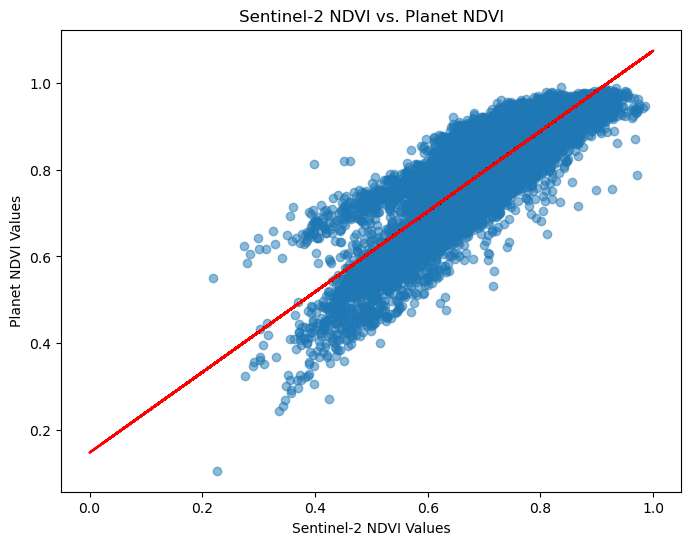

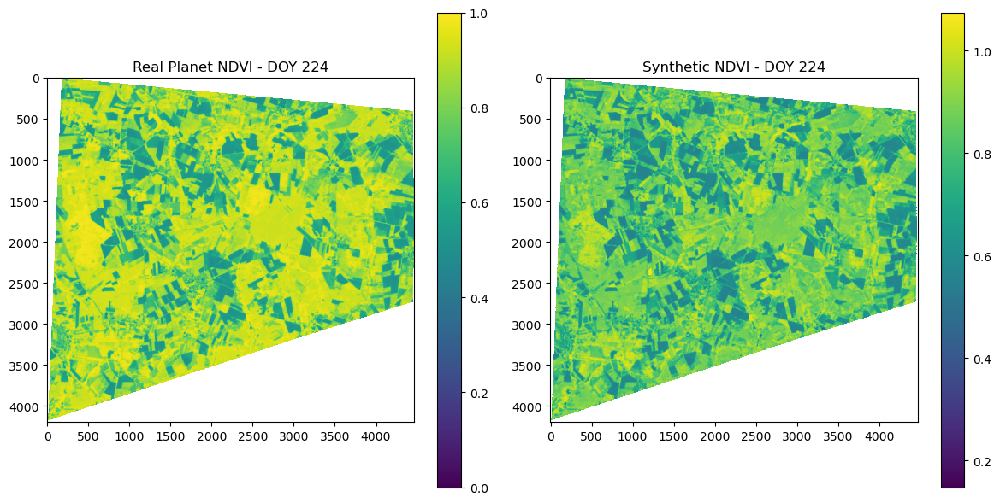

In [ ]:
visualize_and_predict(
    linear_model,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    129,
)

# Random forest regression

### 4 Trees

In [27]:
rf_model_4 = RandomForestRegressor(n_estimators=4, random_state=42)
rf_model_4.fit(X_train.reshape(-1, 1), y_train.ravel())

RandomForestRegressor(n_estimators=4, random_state=42)

Saving model for reuse

In [28]:
import pickle

with open("rf_n4_rs42_2022_each_image_scaled.pkl", "wb") as f:
    pickle.dump(rf_model_4, f)

Model evaluation

In [29]:
mse = evaluate_model(rf_model_4, X_test.T[1].reshape(-1, 1), y_test.T[1])

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.005373984614642592


Visualisation and prediction

In [36]:
visualize_and_predict(
    rf_model_4,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    129,
)

KeyboardInterrupt: 

### 40 Trees

In [23]:
rf_model_40 = RandomForestRegressor(n_estimators=40, random_state=42)
rf_model_40.fit(X_train.reshape(-1, 1), y_train.ravel())

RandomForestRegressor(n_estimators=40, random_state=42)

Save model for reuse

In [38]:
import pickle

with open("rf_n40_rs42_2022_each_image_scaled.pkl", "wb") as f:
    pickle.dump(rf_model_40, f)

Model evaluation

In [25]:
mse = evaluate_model(rf_model_40, X_test.T[1].reshape(-1, 1), y_test.T[1])

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.005324219729345869


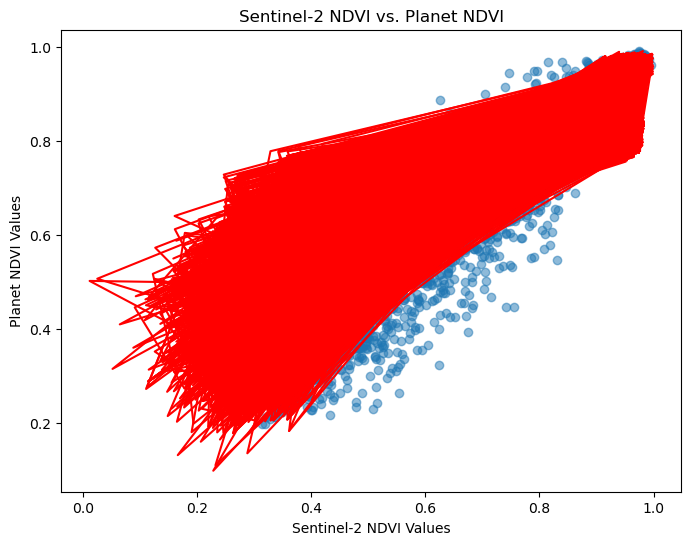

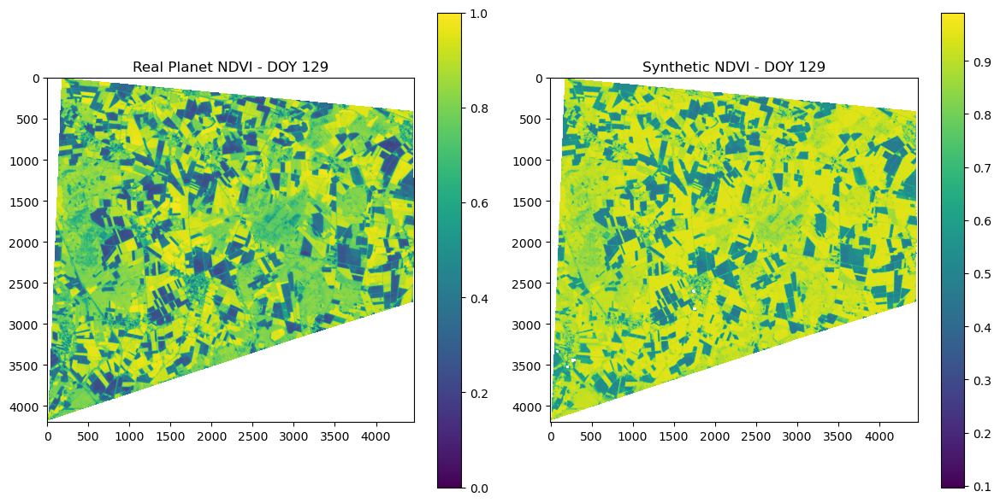

In [35]:
visualize_and_predict(
    rf_model_40,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    129,
)

In [7]:
from joblib import parallel_backend

with parallel_backend("threading", n_jobs=10):
    rf_model_40 = RandomForestRegressor(
        n_estimators=40, random_state=42, max_features="sqrt", min_samples_leaf=2
    )
    rf_model_40.fit(X_train.reshape(-1, 1), y_train.ravel())

Save model for reuse

In [8]:
import pickle

with open("rf_n40_rs42_sqrt_2022_each_image_scaled.pkl", "wb") as f:
    pickle.dump(rf_model_40, f)

Model evaluation

In [9]:
mse = evaluate_model(rf_model_40, X_test.T[1].reshape(-1, 1), y_test.T[1])

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.005274975783189114


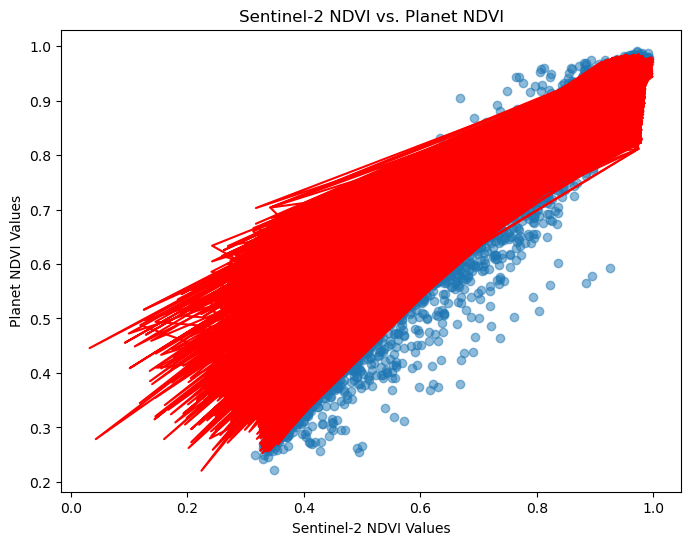

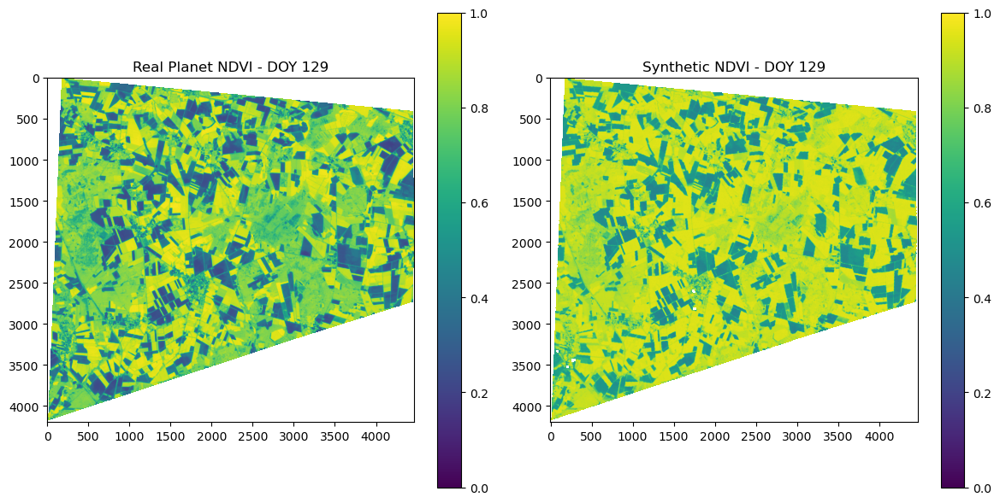

In [35]:
visualize_and_predict(
    rf_model_40,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    129,
)

# Regression with all images concatinated

In [29]:
X, y, resampled_sentinel_images = prepare_data_for_regression(
    sentinel_images, planet_images, scale_data=scale_data
)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

### Linear regression

In [32]:
linear_model = LinearRegression()
linear_model.fit(X_train.reshape(-1, 1), y_train.ravel())

LinearRegression()

Model evaluation using mean squared error (MSE)

In [33]:
mse = evaluate_model(linear_model, X_test.reshape(-1, 1), y_test)

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.0014232542598620057


Visualisation and prediction

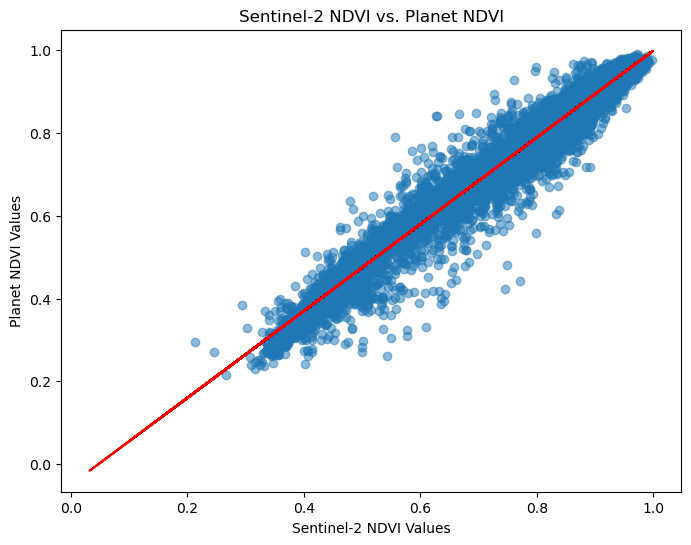

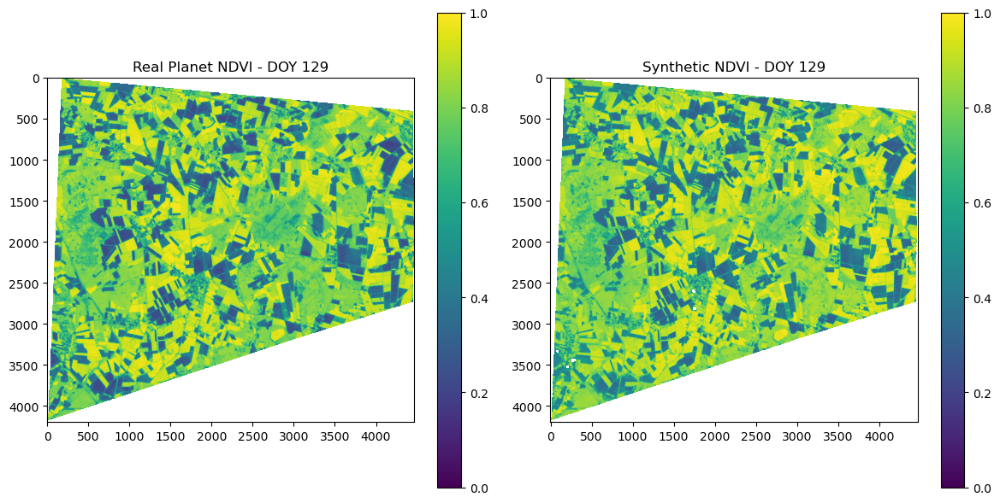

In [34]:
visualize_and_predict(
    linear_model,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    129,
)

# Random forest regression

### 4 Trees

In [16]:
from joblib import parallel_backend

with parallel_backend("threading", n_jobs=10):
    rf_model_4 = RandomForestRegressor(
        n_estimators=4, random_state=42, max_features="sqrt", min_samples_leaf=2
    )
    rf_model_4.fit(X_train.reshape(-1, 1), y_train.ravel())

Saving model for reuse

In [17]:
import pickle

with open("rf_n4_rs42_sqrt_maxsl2_2022_concatinated_scaled.pkl", "wb") as f:
    pickle.dump(rf_model_4, f)

Model evaluation

In [19]:
mse = evaluate_model(rf_model_4, X_test.reshape(-1, 1), y_test)

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.001464906304956068


Visualisation and prediction

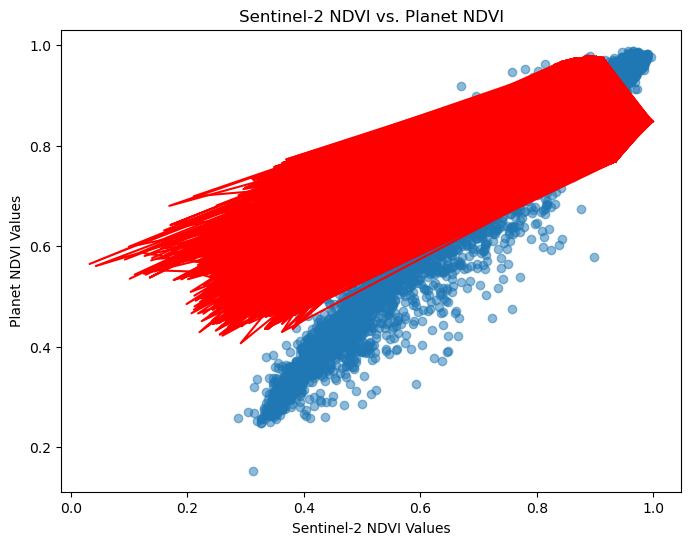

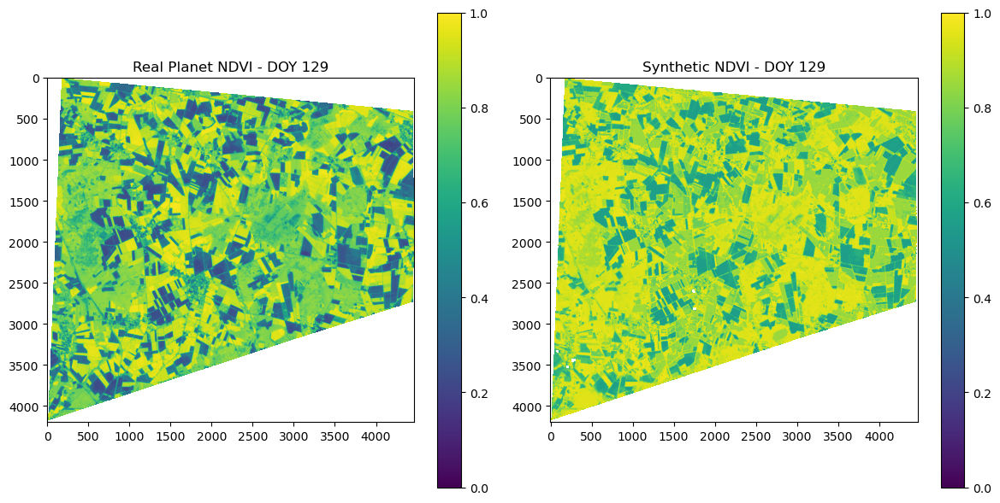

In [30]:
visualize_and_predict(
    rf_model_4,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    129,
)

### 40 Trees

In [ ]:
from joblib import parallel_backend

with parallel_backend('threading', n_jobs=10):

rf_model_40 = RandomForestRegressor(
    n_estimators=40, random_state=42
)
rf_model_40.fit(X_train.reshape(-1, 1), y_train.ravel())

Save model for reuse

In [ ]:
import pickle

with open("rf_n40_rs42_2022_concatinated_scaled.pkl", "wb") as f:
    pickle.dump(rf_model_40, f)

Model evaluation

In [ ]:
mse = evaluate_model(rf_model_40, X_test.T[1].reshape(-1, 1), y_test.T[1])

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.005153544294396699


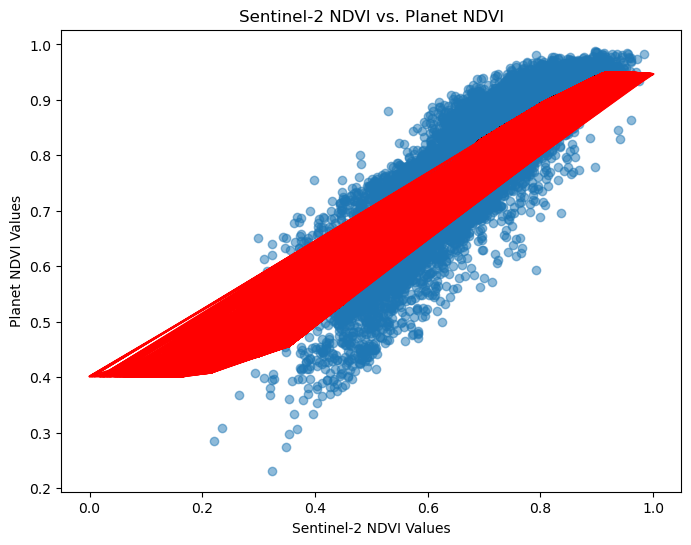

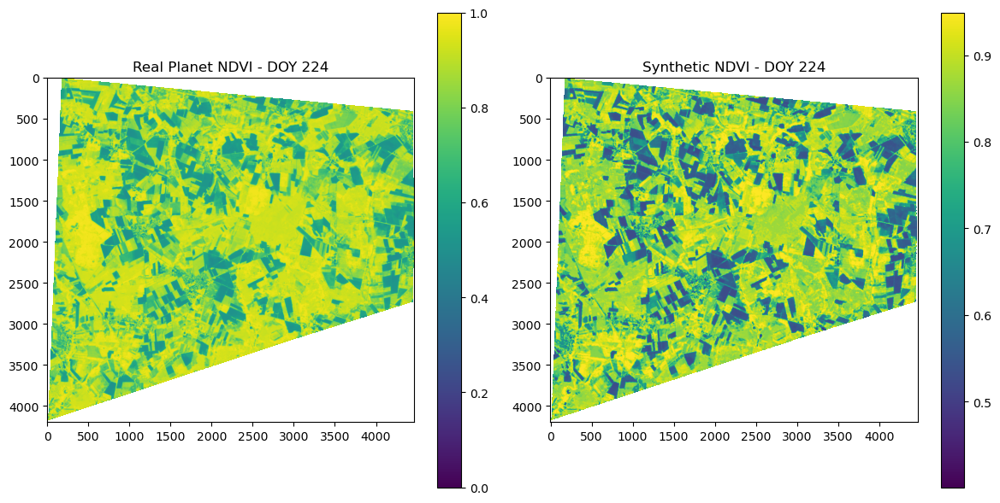

In [ ]:
visualize_and_predict(
    rf_model_40,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    224,
)

# EVERYTHING UNSCALED/UNNORMALIZED

In [10]:
scale_data = False

# Regression with each image as feature

In [11]:
X, y, resampled_sentinel_images = prepare_data_for_regression_individual_images(
    sentinel_images, planet_images, scale_data=scale_data
)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

### Linear regression

In [12]:
linear_model = LinearRegression()
linear_model.fit(X_train.reshape(-1, 1), y_train.ravel())

LinearRegression()

Model evaluation using mean squared error (MSE)

In [18]:
mse = evaluate_model(linear_model, X_test.T[0].reshape(-1, 1), y_test.T[0])

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.0034004244953393936


Visualisation and prediction

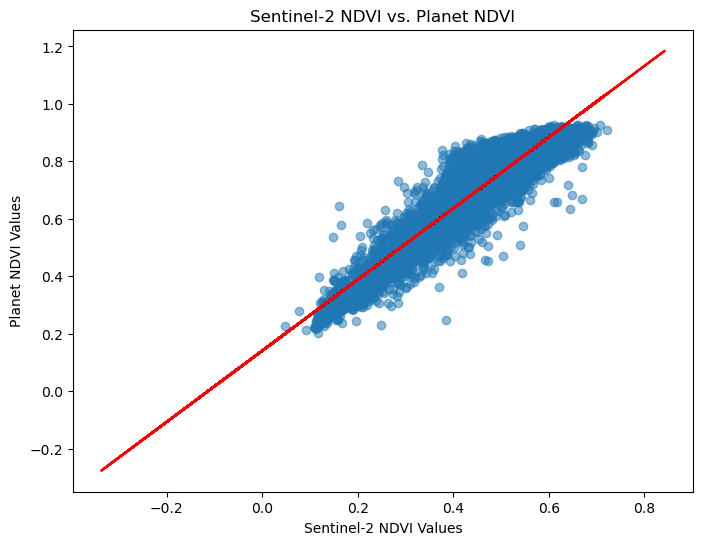

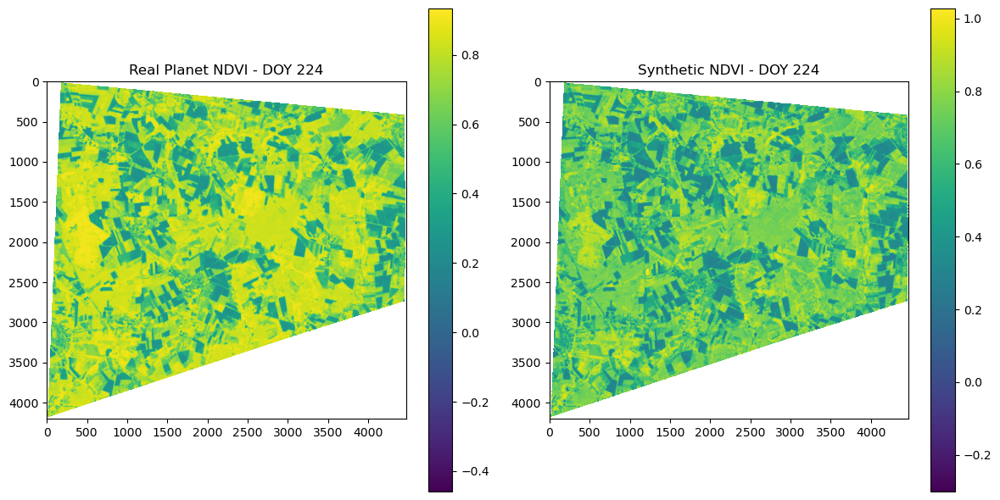

In [19]:
visualize_and_predict(
    linear_model,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    224,
)

# Random forest regression

### 4 Trees

In [ ]:
rf_model_4 = RandomForestRegressor(n_estimators=4, random_state=42)
rf_model_4.fit(X_train.reshape(-1, 1), y_train.ravel())

RandomForestRegressor(max_depth=8, max_features='sqrt', n_estimators=4,
                      random_state=42)

Saving model for reuse

In [ ]:
import pickle

with open("rf_n4_rs42_2022_each_image_unscaled.pkl", "wb") as f:
    pickle.dump(rf_model_4, f)

Model evaluation

In [ ]:
mse = evaluate_model(rf_model_4, X_test.T[1].reshape(-1, 1), y_test.T[1])

print(f"Linear Regression MSE: {mse}")

Visualisation and prediction

In [ ]:
visualize_and_predict(
    rf_model_4,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    224,
)

### 40 Trees

In [ ]:
rf_model_40 = RandomForestRegressor(n_estimators=40, random_state=42)
rf_model_40.fit(X_train.reshape(-1, 1), y_train.ravel())

Save model for reuse

In [ ]:
import pickle

with open("rf_n40_rs42_2022_each_image_unscaled.pkl", "wb") as f:
    pickle.dump(rf_model_40, f)

Model evaluation

In [ ]:
mse = evaluate_model(rf_model_40, X_test.T[1].reshape(-1, 1), y_test.T[1])

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.005153544294396699


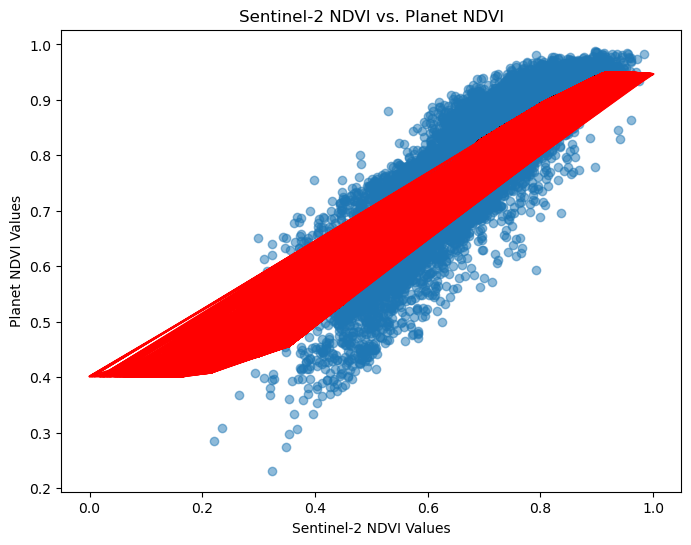

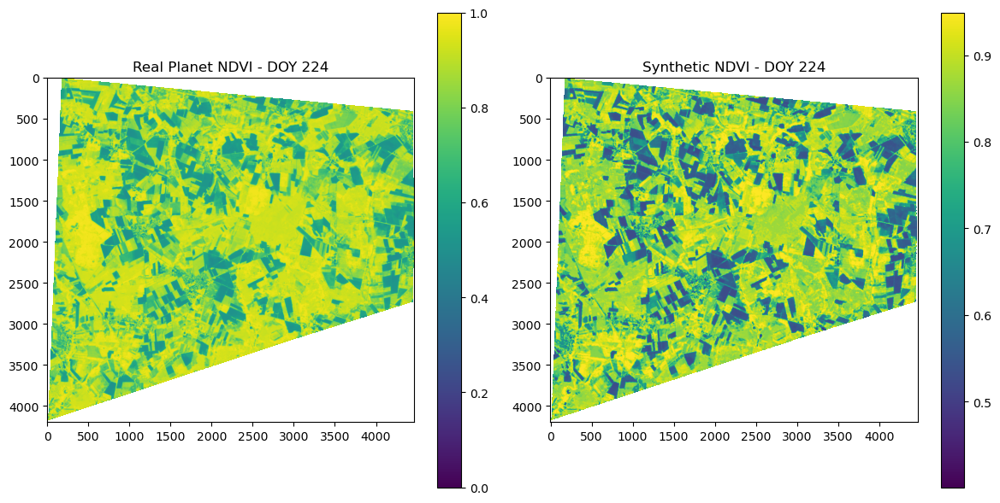

In [ ]:
visualize_and_predict(
    rf_model_40,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    224,
)

# Regression with all images concatinated

In [ ]:
X, y, resampled_sentinel_images = prepare_data_for_regression(
    sentinel_images, planet_images, scale_data=scale_data
)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

### Linear regression

In [ ]:
linear_model = LinearRegression()
linear_model.fit(X_train.reshape(-1, 1), y_train.ravel())

LinearRegression()

Model evaluation using mean squared error (MSE)

In [ ]:
mse = evaluate_model(linear_model, X_test.reshape(-1, 1), y_test)

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.0012048357166349888


Visualisation and prediction

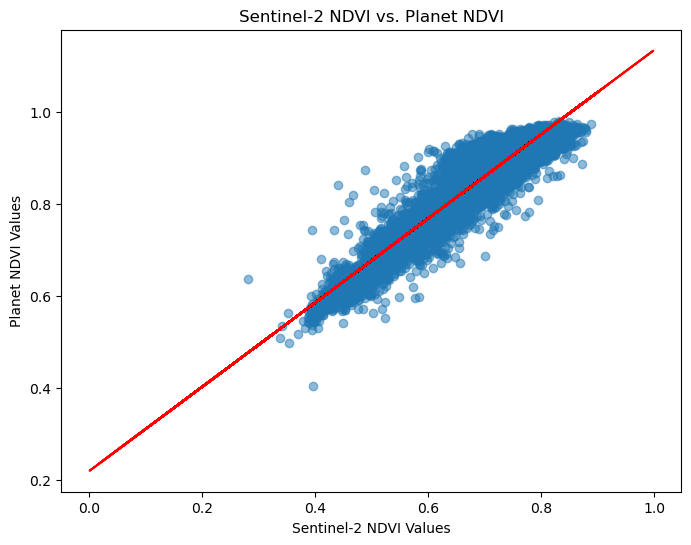

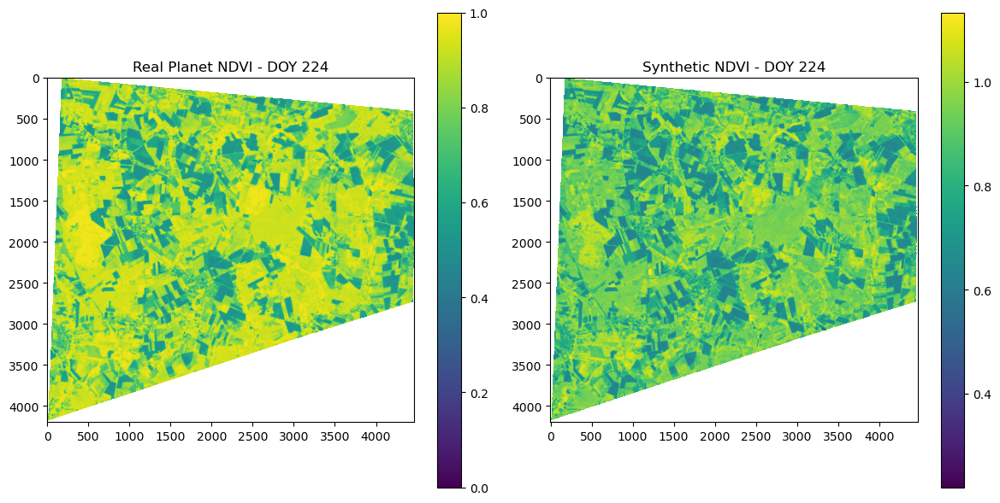

In [ ]:
visualize_and_predict(
    linear_model,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    224,
)

# Random forest regression

### 4 Trees

In [ ]:
rf_model_4 = RandomForestRegressor(n_estimators=4, random_state=42)
rf_model_4.fit(X_train.reshape(-1, 1), y_train.ravel())

RandomForestRegressor(max_depth=8, max_features='sqrt', n_estimators=4,
                      random_state=42)

Saving model for reuse

In [ ]:
import pickle

with open("rf_n4_rs42_2022_concatinated_scaled.pkl", "wb") as f:
    pickle.dump(rf_model_4, f)

Model evaluation

In [ ]:
mse = evaluate_model(rf_model_4, X_test.T[1].reshape(-1, 1), y_test.T[1])

print(f"Linear Regression MSE: {mse}")

Visualisation and prediction

In [ ]:
visualize_and_predict(
    rf_model_4,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    224,
)

### 40 Trees

In [ ]:
rf_model_40 = RandomForestRegressor(n_estimators=40, random_state=42)
rf_model_40.fit(X_train.reshape(-1, 1), y_train.ravel())

Save model for reuse

In [ ]:
import pickle

with open("rf_n40_rs42_2022_concatinated_scaled.pkl", "wb") as f:
    pickle.dump(rf_model_40, f)

Model evaluation

In [ ]:
mse = evaluate_model(rf_model_40, X_test.T[1].reshape(-1, 1), y_test.T[1])

print(f"Linear Regression MSE: {mse}")

Linear Regression MSE: 0.005153544294396699


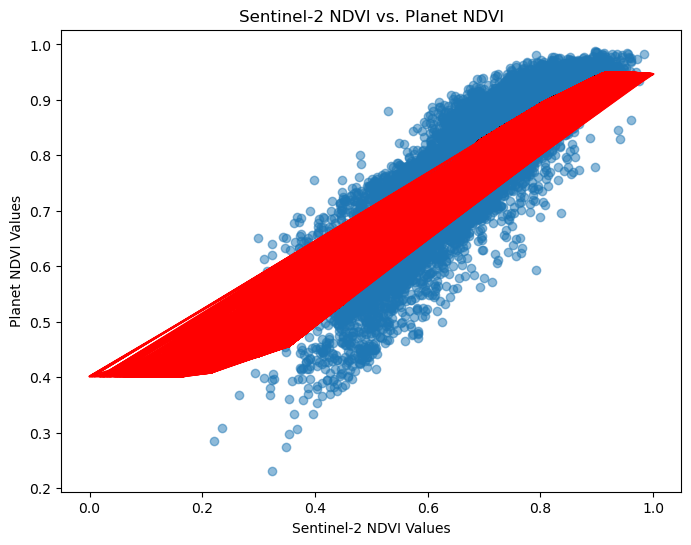

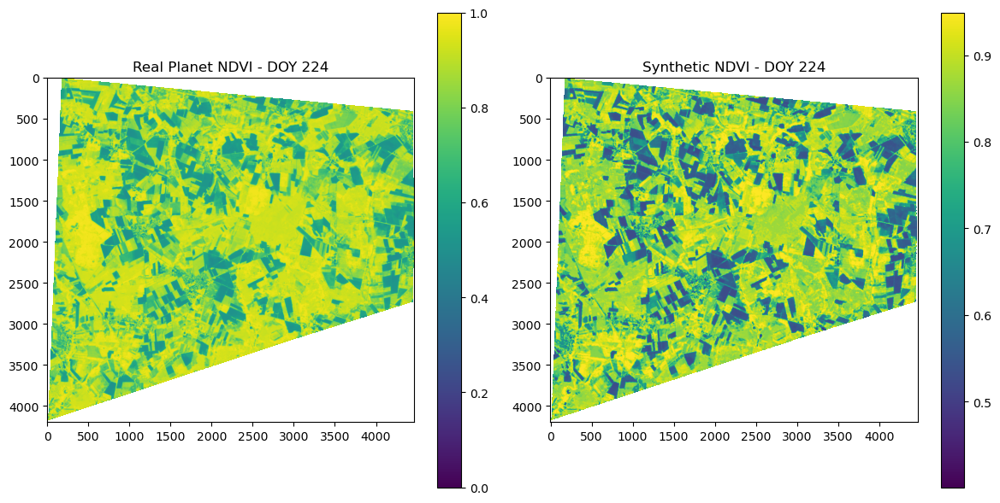

In [ ]:
visualize_and_predict(
    rf_model_40,
    X_test,
    y_test,
    resampled_sentinel_images,
    planet_images,
    scale_data,
    224,
)